# **Importing the necessary libraries**

In [ ]:
pip install split-folders

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import splitfolders
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelBinarizer
from keras.models import Sequential
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input,concatenate,MaxPool2D
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from keras.utils import plot_model
from sklearn import svm
from sklearn.svm import SVC
from sklearn.decomposition import PCA as RandomizedPCA
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, ConfusionMatrixDisplay
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.model_selection import learning_curve

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **The First Dataset**
https://www.kaggle.com/datasets/datamunge/sign-language-mnist/data


Loading dataset 1



In [ ]:
train_df = pd.read_csv('/content/drive/My Drive/Project/sign_mnist_train.csv')
test_df = pd.read_csv('/content/drive/My Drive/Project/sign_mnist_test.csv')

In [ ]:
test = pd.read_csv('/content/drive/My Drive/Project/sign_mnist_test.csv')
y = test['label']

In [ ]:
train_df

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,3,107,118,127,134,139,143,146,150,153,...,207,207,207,207,206,206,206,204,203,202
1,6,155,157,156,156,156,157,156,158,158,...,69,149,128,87,94,163,175,103,135,149
2,2,187,188,188,187,187,186,187,188,187,...,202,201,200,199,198,199,198,195,194,195
3,2,211,211,212,212,211,210,211,210,210,...,235,234,233,231,230,226,225,222,229,163
4,13,164,167,170,172,176,179,180,184,185,...,92,105,105,108,133,163,157,163,164,179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27450,13,189,189,190,190,192,193,193,193,193,...,132,165,99,77,52,200,234,200,222,225
27451,23,151,154,157,158,160,161,163,164,166,...,198,198,198,198,198,196,195,195,195,194
27452,18,174,174,174,174,174,175,175,174,173,...,121,196,209,208,206,204,203,202,200,200
27453,17,177,181,184,185,187,189,190,191,191,...,119,56,27,58,102,79,47,64,87,93


Data Exploration

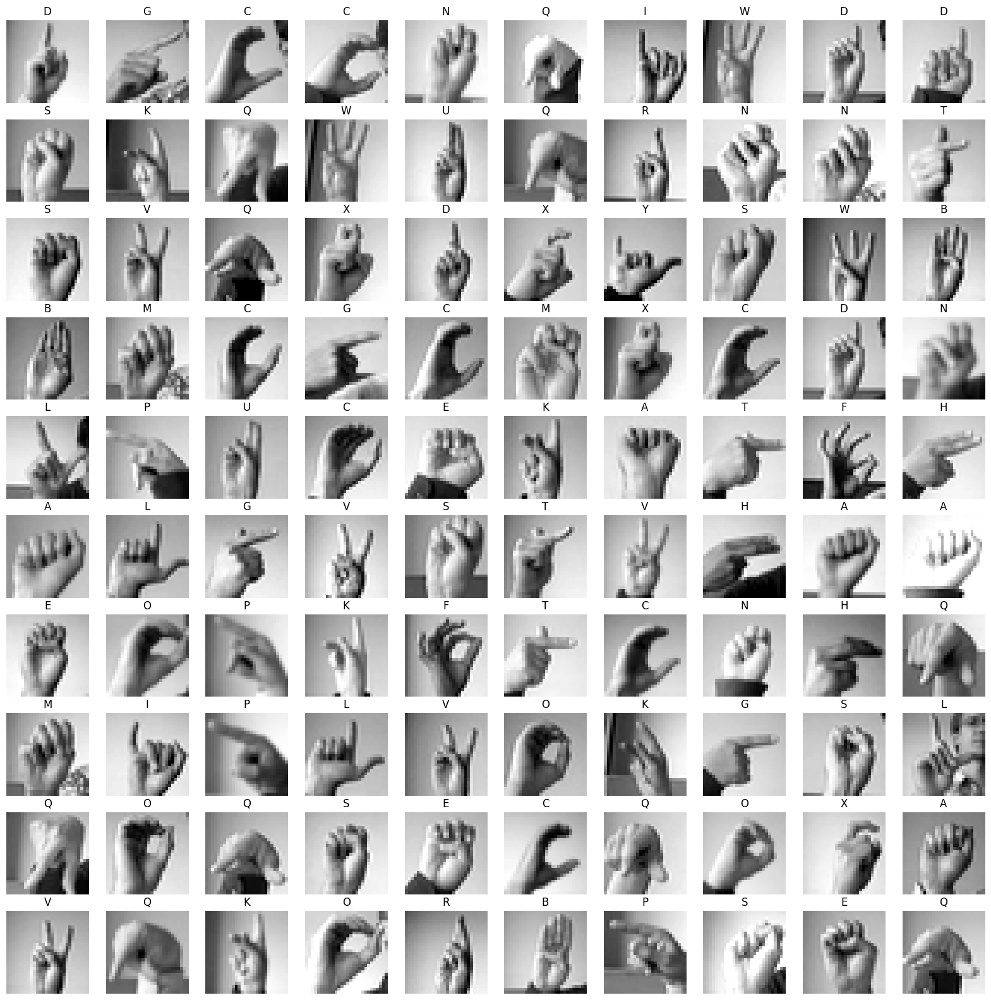

In [ ]:
categories1 = {
    0: 'A', 1: 'B', 2: 'C', 3: 'D', 4: 'E', 5: 'F', 6: 'G',
    7: 'H', 8: 'I', 10: 'K', 11: 'L', 12: 'M', 13: 'N',
    14: 'O', 15: 'P', 16: 'Q', 17: 'R', 18: 'S', 19: 'T',
    20: 'U', 21: 'V', 22: 'W', 23: 'X', 24: 'Y',
}

# Define the number of images to plot
num_images_to_plot = 100

# Set the figure size for the plot
plt.figure(figsize=(20, 20))

for i in range(num_images_to_plot):
    pixels = train_df.iloc[i, 1:].values
    image = pixels.reshape(28, 28)
    label = train_df.iloc[i, 0]
    plt.subplot(10, 10, i + 1)
    plt.imshow(image, cmap='gray')
    plt.title(categories1[label], fontsize=12)
    plt.axis("off")

plt.show()

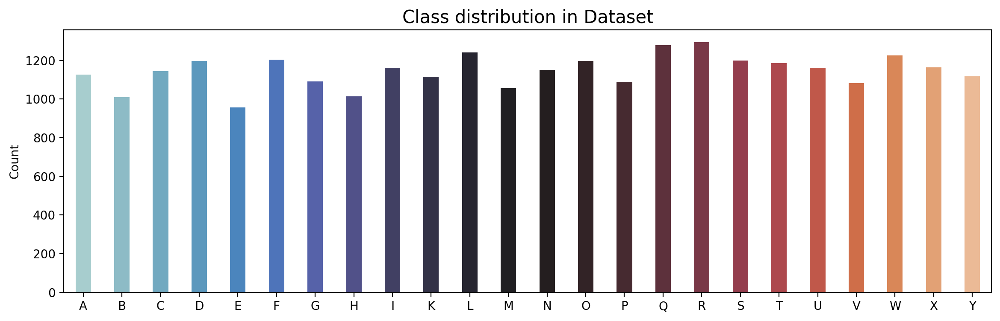

In [ ]:
label, count = np.unique(train_df['label'], return_counts=True)
uni = pd.DataFrame(data={'Count': count}, index=categories1.values())

plt.figure(figsize=(14, 4), dpi=200)
sns.barplot(data=uni, x=uni.index, y='Count', palette='icefire', width=0.4)
plt.title('Class distribution in Dataset', fontsize=15)
plt.show()

Data Preparation

In [ ]:
y_train = train_df['label']
y_test = test_df['label']
del train_df['label']
del test_df['label']

In [ ]:
x_train = train_df.values
x_test = test_df.values

In [ ]:
# Normalize the data
x_train = x_train / 255
x_test = x_test / 255

# **Model 1 : SVM for the first dataset**

preprocessing for SVM

In [ ]:
# Standardize features by removing the mean and scaling to unit variance
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

**Model Training**

Finding the Best Parameters using GridSearchCV and Create SVM with RBF kernel

In [ ]:

param_grid = {'svc__C': [1, 5, 10],
              'svc__gamma': [0.0005, 0.001, 0.005]}


pca = RandomizedPCA(n_components=150, whiten=True, random_state=42)
svm = SVC(kernel='rbf', class_weight='balanced')
model = make_pipeline(pca, svm)

grid = GridSearchCV(model, param_grid, scoring='accuracy', cv=5, verbose=2, return_train_score=True)



%time grid.fit(x_train, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time= 1.4min
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time= 1.2min
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time= 1.2min
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time= 1.2min
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time= 1.2min
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=  49.7s
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=  51.0s
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=  50.2s
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=  49.8s
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=  52.6s
[CV] END .........................svc__C=1, svc__gamma=0.005; total time=  28.4s
[CV] END .........................svc__C=1, svc__

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('pca',
                                        PCA(n_components=150, random_state=42,
                                            whiten=True)),
                                       ('svc', SVC(class_weight='balanced'))]),
             param_grid={'svc__C': [1, 5, 10],
                         'svc__gamma': [0.0005, 0.001, 0.005]},
             return_train_score=True, scoring='accuracy', verbose=2)

In [ ]:
print(f'Best parameters are: {grid.best_params_}')
mean_score = grid.cv_results_['mean_test_score']
std_score = grid.cv_results_['std_test_score']
params = grid.cv_results_['params']
for mean,std,params in zip(mean_score,std_score,params):
      print(f'{round(mean,2)} + or -{round(std,2)} for the {params}')

Best parameters are: {'svc__C': 1, 'svc__gamma': 0.005}
0.96 + or -0.0 for the {'svc__C': 1, 'svc__gamma': 0.0005}
0.99 + or -0.0 for the {'svc__C': 1, 'svc__gamma': 0.001}
1.0 + or -0.0 for the {'svc__C': 1, 'svc__gamma': 0.005}
1.0 + or -0.0 for the {'svc__C': 5, 'svc__gamma': 0.0005}
1.0 + or -0.0 for the {'svc__C': 5, 'svc__gamma': 0.001}
1.0 + or -0.0 for the {'svc__C': 5, 'svc__gamma': 0.005}
1.0 + or -0.0 for the {'svc__C': 10, 'svc__gamma': 0.0005}
1.0 + or -0.0 for the {'svc__C': 10, 'svc__gamma': 0.001}
1.0 + or -0.0 for the {'svc__C': 10, 'svc__gamma': 0.005}


Predict and evaluate the model using the best parameters

In [ ]:
model = grid.best_estimator_
y_pred = model.predict(x_test)

##calculate and print the accuracy and f1 scores for SVM with best RBF kernel:
bestRBF_accuracy = accuracy_score(y_test, y_pred)
bestRBF_f1 = f1_score(y_test, y_pred, average='weighted')
print(' RBF Accuracy : ', "%.2f" % (bestRBF_accuracy))
print('RBF F1 : ', "%.2f" % (bestRBF_f1))

 RBF Accuracy :  0.77
RBF F1 :  0.77


test images along with their predicted values

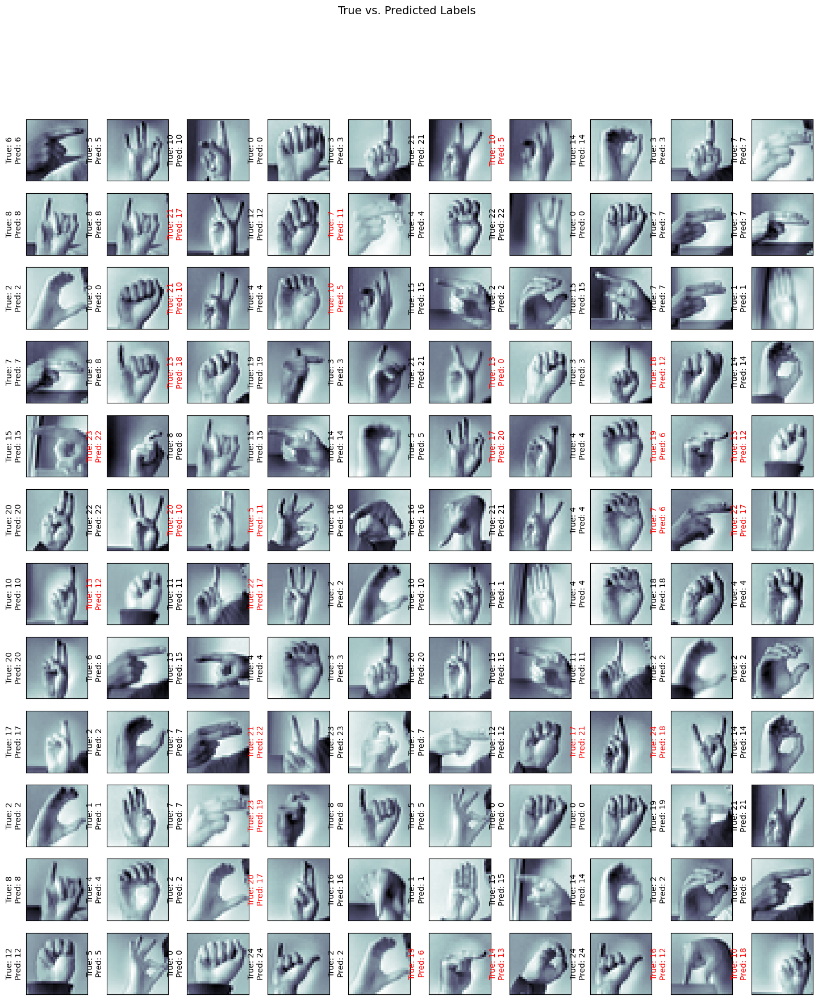

In [ ]:

fig, ax = plt.subplots(12, 10, figsize=(18, 20))

# Iterate over the subplots
for i, axi in enumerate(ax.flat):

    axi.imshow(x_test[i].reshape(28, 28), cmap='bone')
    axi.set(xticks=[], yticks=[])

    # Use the true and predicted labels directly
    true_label = y_test[i]
    predicted_label = y_pred[i]

    # Check if the prediction is correct
    color = 'black' if predicted_label == true_label else 'red'

    axi.set_ylabel(f'True: {true_label}\nPred: {predicted_label}', color=color)

fig.suptitle('True vs. Predicted Labels', size=14)
plt.show()


Classification report

In [ ]:
print(classification_report(y_test, y_pred,
                            target_names=list(categories1.values())))

              precision    recall  f1-score   support

           A       0.94      1.00      0.97       331
           B       1.00      0.87      0.93       431
           C       1.00      0.99      1.00       308
           D       0.86      1.00      0.92       245
           E       0.90      0.92      0.91       497
           F       0.72      0.91      0.81       247
           G       0.82      0.82      0.82       348
           H       0.91      0.81      0.86       436
           I       0.95      0.56      0.70       288
           K       0.48      0.45      0.46       331
           L       0.75      0.95      0.84       209
           M       0.68      0.72      0.70       393
           N       0.67      0.58      0.62       291
           O       1.00      0.74      0.85       246
           P       0.91      0.94      0.92       347
           Q       0.75      0.84      0.79       164
           R       0.29      0.44      0.35       144
           S       0.48    

confusion matrix

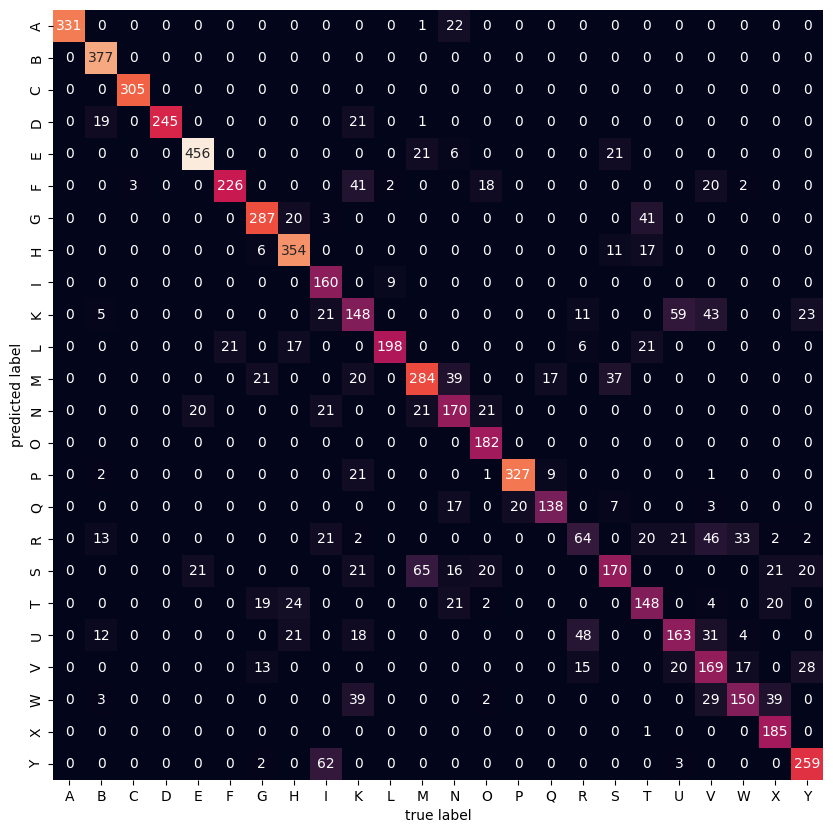

In [ ]:
mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(categories1.values()),
            yticklabels=list(categories1.values()))
plt.xlabel('true label')
plt.ylabel('predicted label');

Learning curve

In [ ]:
train_sizes, train_scores, valid_scores = learning_curve(
    model, x_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Accuracy')
plt.plot(train_sizes, np.mean(valid_scores, axis=1), label='Validation Accuracy')

plt.title('Learning Curve for SVM with RBF Kernel')
plt.xlabel('Number of Training Examples')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# **Model 2 : CNN for the first dataset**

Data Preparation

In [ ]:
label_binarizer = LabelBinarizer()
y_train = label_binarizer.fit_transform(y_train)
y_test = label_binarizer.transform(y_test)

In [ ]:
# Reshaping the data from 1-D to 3-D as required through input by CNN's
x_train = x_train.reshape(-1,28,28,1)
x_test = x_test.reshape(-1,28,28,1)

Data Augmentation


In [ ]:

datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images


datagen.fit(x_train)

Training the model

In [ ]:
my_variable = tf.Variable(0.0)

CNN1_model = Sequential()

CNN1_model.add(Conv2D(75 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu' , input_shape = (28,28,1)))
CNN1_model.add(BatchNormalization())

CNN1_model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

CNN1_model.add(Conv2D(50 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
CNN1_model.add(Dropout(0.2))
CNN1_model.add(BatchNormalization())

CNN1_model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

CNN1_model.add(Conv2D(25 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
CNN1_model.add(BatchNormalization())

CNN1_model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))

CNN1_model.add(Flatten())

CNN1_model.add(Dense(units = 512 , activation = 'relu'))
CNN1_model.add(Dropout(0.3))

CNN1_model.add(Dense(units = 24 , activation = 'softmax'))

CNN1_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 75)        750       
                                                                 
 batch_normalization (BatchN  (None, 28, 28, 75)       300       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 75)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 50)        33800     
                                                                 
 dropout (Dropout)           (None, 14, 14, 50)        0         
                                                                 
 batch_normalization_1 (Batc  (None, 14, 14, 50)       2

Call backs

In [ ]:
#EarlyStopping : Stop training when a monitored metric has stopped improving.
early_stoping = EarlyStopping(monitor='val_loss',
                              min_delta=0.001,
                              patience= 5,
                              restore_best_weights= True,
                              verbose = 0)
#ReduceLROnPlateau : Reduce learning rate when a metric has stopped improving.
reduce_learning_rate = ReduceLROnPlateau(monitor='val_accuracy',
                                         patience = 2,
                                         factor=0.5 ,
                                         verbose = 1)

Compile the model

In [ ]:
CNN1_model.compile(optimizer='adam', loss = 'categorical_crossentropy' , metrics=['accuracy'])

Fit the model

In [ ]:
history = CNN1_model.fit(datagen.flow(x_train, y_train, batch_size=128), epochs=20, validation_data=(x_test, y_test),
                         callbacks=[early_stoping, reduce_learning_rate])

Epoch 1/20
215/215 [==============================] - 161s 749ms/step - loss: 0.7896 - accuracy: 0.7421 - val_loss: 4.3752 - val_accuracy: 0.0617 - lr: 0.0010
Epoch 2/20
215/215 [==============================] - 158s 734ms/step - loss: 0.2264 - accuracy: 0.9253 - val_loss: 0.6462 - val_accuracy: 0.7726 - lr: 0.0010
Epoch 3/20
215/215 [==============================] - 150s 697ms/step - loss: 0.1150 - accuracy: 0.9634 - val_loss: 0.0680 - val_accuracy: 0.9838 - lr: 0.0010
Epoch 4/20
215/215 [==============================] - 175s 815ms/step - loss: 0.0757 - accuracy: 0.9761 - val_loss: 0.0245 - val_accuracy: 0.9930 - lr: 0.0010
Epoch 5/20
215/215 [==============================] - 166s 772ms/step - loss: 0.0452 - accuracy: 0.9852 - val_loss: 0.0364 - val_accuracy: 0.9930 - lr: 0.0010
Epoch 6/20
215/215 [==============================] - ETA: 0s - loss: 0.0389 - accuracy: 0.9881
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
215/215 [========================

Evaluation

In [ ]:
# Evaluate for training data
loss_train, acc_train = CNN1_model.evaluate(x_train, y_train, verbose=0)
print('The accuracy of the model for training data is:', acc_train * 100)
print('The Loss of the model for training data is:', loss_train)

# Evaluate for validation data (x_test and y_test)
loss_val, acc_val = CNN1_model.evaluate(x_test, y_test, verbose=0)
print('The accuracy of the model for validation data is:', acc_val * 100)
print('The Loss of the model for validation data is:', loss_val)

The accuracy of the model for training data is: 100.0
The Loss of the model for training data is: 0.0005837330827489495
The accuracy of the model for validation data is: 100.0
The Loss of the model for validation data is: 0.0016704335575923324


Plot the results

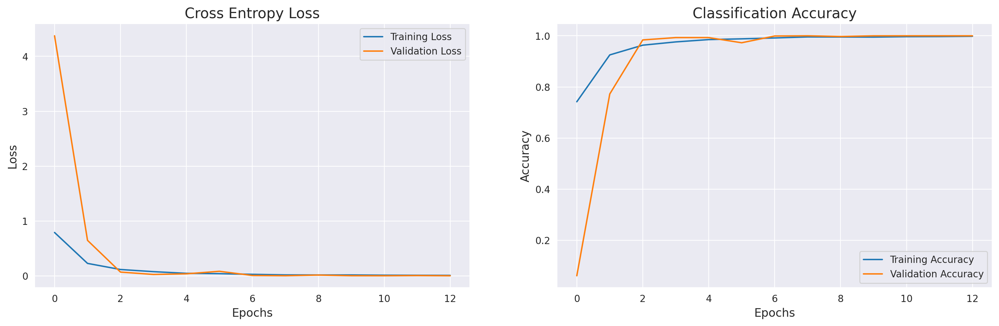

In [ ]:
error = history .history

plt.figure(figsize=(18, 5), dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss', fontsize=15)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.plot(error['loss'], label='Training Loss')
plt.plot(error['val_loss'], label='Validation Loss')
plt.legend()

plt.subplot(122)
plt.title('Classification Accuracy', fontsize=15)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.plot(error['accuracy'], label='Training Accuracy')
plt.plot(error['val_accuracy'], label='Validation Accuracy')
plt.legend()

plt.show()


Save the model

In [ ]:
CNN1_model.save('CNN1_model')

Prediction

In [ ]:
y_pred = CNN1_model.predict(x_test, batch_size=128, verbose=0)
y_pred=np.argmax(y_pred, axis=1)
y_pred[1]

y_true=np.argmax(y_test, axis=1)
y_true[1]

Classification Report

In [ ]:
target_names = ["Class " + str(i) for i in range(25) if i != 9]

# Generate the classification report
report = classification_report(y_true, y_pred, target_names=categories1.values())

# Print the classification report
print(report)


              precision    recall  f1-score   support

     Class 0       1.00      1.00      1.00       331
     Class 1       1.00      1.00      1.00       431
     Class 2       1.00      1.00      1.00       308
     Class 3       1.00      1.00      1.00       245
     Class 4       1.00      1.00      1.00       497
     Class 5       1.00      1.00      1.00       247
     Class 6       1.00      1.00      1.00       348
     Class 7       1.00      1.00      1.00       436
     Class 8       1.00      1.00      1.00       288
    Class 10       1.00      1.00      1.00       331
    Class 11       1.00      1.00      1.00       209
    Class 12       1.00      1.00      1.00       393
    Class 13       1.00      1.00      1.00       291
    Class 14       1.00      1.00      1.00       246
    Class 15       1.00      1.00      1.00       347
    Class 16       1.00      1.00      1.00       164
    Class 17       1.00      1.00      1.00       144
    Class 18       1.00    

Confusion matrix

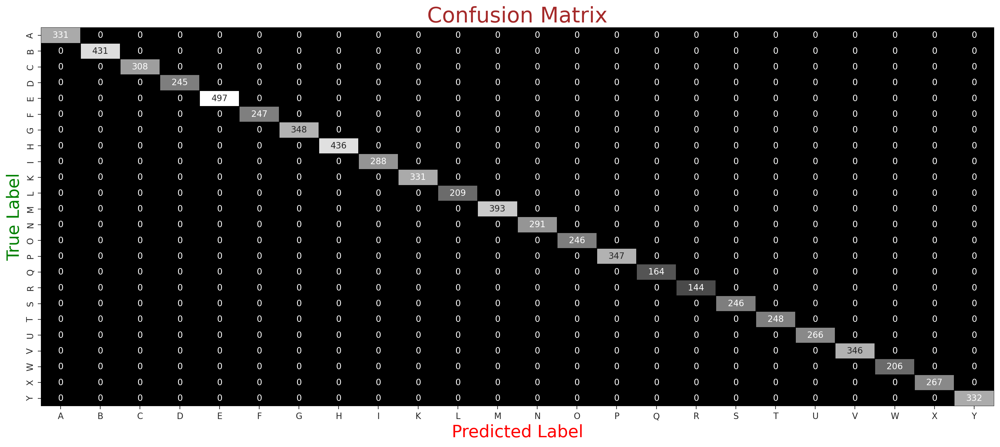

In [ ]:
sns.set_style('ticks')

confusion_mtx = confusion_matrix(y_true,y_pred)

f,ax = plt.subplots(figsize = (20,8),dpi=200)

sns.heatmap(confusion_mtx, annot=True,
            linewidths=0.1, cmap = "gist_yarg_r",
            linecolor="black", fmt='.0f', ax=ax,
            cbar=False, xticklabels=categories1.values(),
            yticklabels=categories1.values())

plt.xlabel("Predicted Label",fontdict={'color':'red','size':20})
plt.ylabel("True Label",fontdict={'color':'green','size':20})
plt.title("Confusion Matrix",fontdict={'color':'brown','size':25})

plt.show()

# **Model 3 : Random Forest for the first dataset**

Using GridSearchCV to find the best hyperparameters for Random Forest model and then print it


In [ ]:
x_train_flat = x_train.reshape(x_train.shape[0], -1)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 15, 20],
}

clf = RandomForestClassifier()

grid_search = GridSearchCV(clf, param_grid, cv=5)

# Fit the GridSearchCV object on the training data
grid_search.fit(x_train_flat, y_train)

best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")

Best Parameters: {'max_depth': 20, 'n_estimators': 200}


Fitting the best RF model and then evaluating it's performance using the testing data

In [ ]:
x_test_flat = x_test.reshape(x_test.shape[0], -1)
best_model = grid_search.best_estimator_

# Make predictions on the test data
rf_pred = best_model.predict(x_test_flat)

# Evaluate the model and Print the evaluation metrics
print("Accuracy:", accuracy_score(y_test, rf_pred))
print("Precision:", precision_score(y_test, rf_pred, average='micro'))
print("Recall:", recall_score(y_test, rf_pred, average='micro'))
print("F1-Score:", f1_score(y_test, rf_pred, average='micro'))

Accuracy: 0.3277521975722059
Precision: 0.9983000424989376
Recall: 0.3277521975722059
F1-Score: 0.4934873949579832


Classification Report

In [ ]:
print(classification_report(y_test, rf_pred,target_names= categories1.values()))

              precision    recall  f1-score   support

           A       1.00      0.82      0.90       331
           B       1.00      0.47      0.64       431
           C       1.00      0.68      0.81       308
           D       1.00      0.24      0.39       245
           E       1.00      0.40      0.58       497
           F       1.00      0.52      0.68       247
           G       0.97      0.44      0.61       348
           H       1.00      0.51      0.68       436
           I       1.00      0.05      0.09       288
           K       1.00      0.09      0.17       331
           L       1.00      0.38      0.55       209
           M       1.00      0.05      0.09       393
           N       1.00      0.02      0.03       291
           O       1.00      0.32      0.49       246
           P       1.00      0.65      0.79       347
           Q       1.00      0.73      0.85       164
           R       1.00      0.12      0.21       144
           S       1.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Confusion matrix

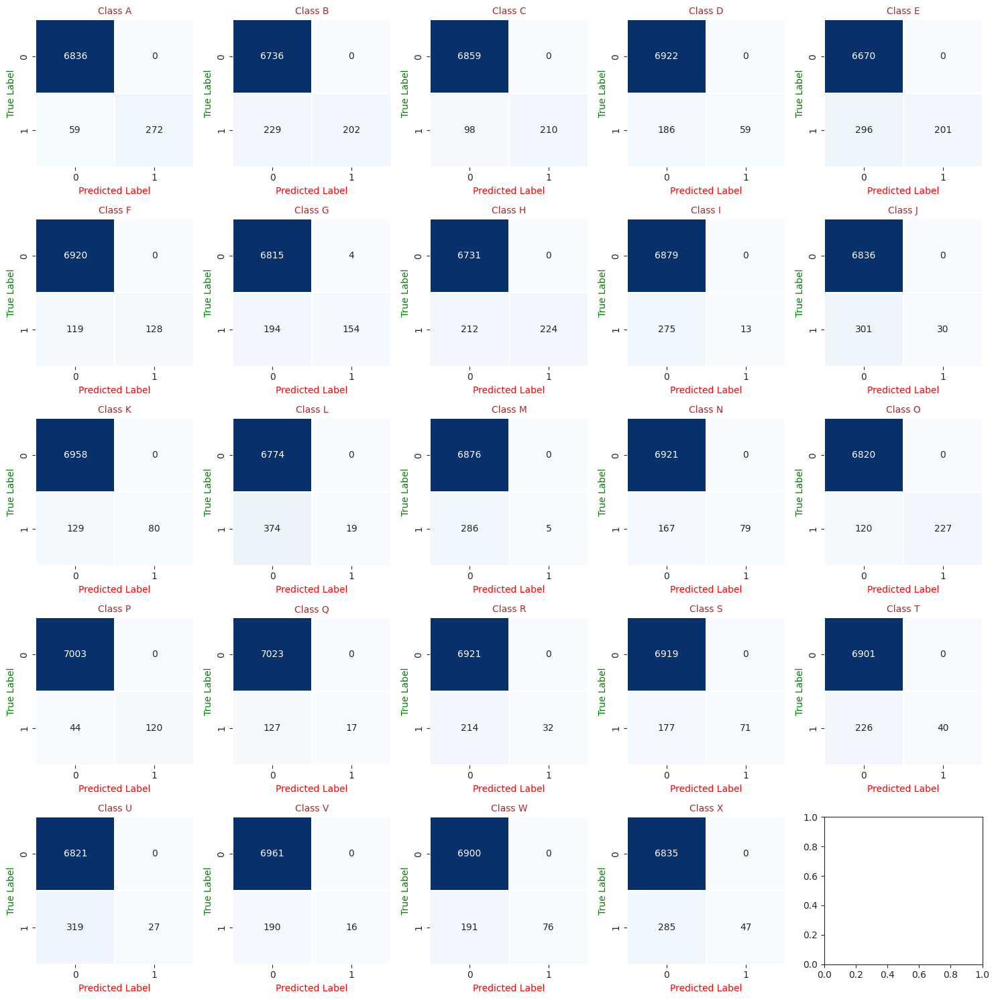

In [ ]:
sns.set_style('ticks')

confusion_mtx = multilabel_confusion_matrix(y_test, rf_pred)

# Number of classes
num_classes = confusion_mtx.shape[0]

# Determine the number of rows and columns for the subplot grid
grid_size = int(num_classes**0.5)
num_rows = num_cols = grid_size if grid_size**2 >= num_classes else grid_size + 1

# Create a subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Plot each confusion matrix in the grid
for i in range(num_rows):
    for j in range(num_cols):
        class_index = i * num_cols + j
        if class_index < num_classes:
            ax = axes[i, j] if num_rows > 1 else axes[j]
            sns.heatmap(confusion_mtx[class_index], annot=True,
                        linewidths=0.1, cmap="Blues", fmt='.0f', ax=ax,
                        cbar=False)

            ax.set_xlabel("Predicted Label", fontdict={'color': 'red', 'size': 10})
            ax.set_ylabel("True Label", fontdict={'color': 'green', 'size': 10})

            # Retrieve class label from categories1 dictionary
            class_label = categories1.get(class_index, f"Unknown Class {class_index}")

            # Adjust title to include class label
            ax.set_title(f"Class {class_label}", fontdict={'color': 'brown', 'size': 10})


# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


# **The Second Dataset**

https://www.kaggle.com/datasets/ayuraj/asl-dataset

Loading the Dataset

In [ ]:
# Path where our data is located
base_path = "/content/drive/My Drive/Project/asl/"


categories = {
                0: "a",
                1: "b",
                2: "c",
                3: "d",
                4: "e",
                5: "f",
                6: "g",
                7: "h",
                8: "i",
                9: "j",
                10: "k",
                11: "l",
                12: "m",
                13: "n",
                14: "o",
                15: "p",
                16: "q",
                17: "r",
                18: "s",
                19: "t",
                20: "u",
                21: "v",
                22: "w",
                23: "x",
                24: "y",
                25: "z",
            }

def add_class_name_prefix(df, col_name):
    df[col_name] = df[col_name].apply(
        lambda x: x[re.search("_", x).start() + 1 : re.search("_", x).start() + 2]
        + "/"
        + x
    )
    return df


# list conatining all the filenames in the dataset
filenames_list = []
# list to store the corresponding category, note that each folder of the dataset has one class of data
categories_list = []

for category in categories:
    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

In [ ]:
df

,filename,category
0,b/hand2_b_bot_seg_1_cropped.jpeg,1
1,z/hand2_z_top_seg_3_cropped.jpeg,25
2,t/hand2_t_left_seg_1_cropped.jpeg,19
3,k/hand1_k_right_seg_3_cropped.jpeg,10
4,r/hand1_r_left_seg_1_cropped.jpeg,17
...,...,...
1810,a/hand2_a_right_seg_2_cropped.jpeg,0
1811,r/hand2_r_right_seg_4_cropped.jpeg,17
1812,n/hand2_n_left_seg_5_cropped.jpeg,13
1813,b/hand2_b_right_seg_1_cropped.jpeg,1


Data Exploration

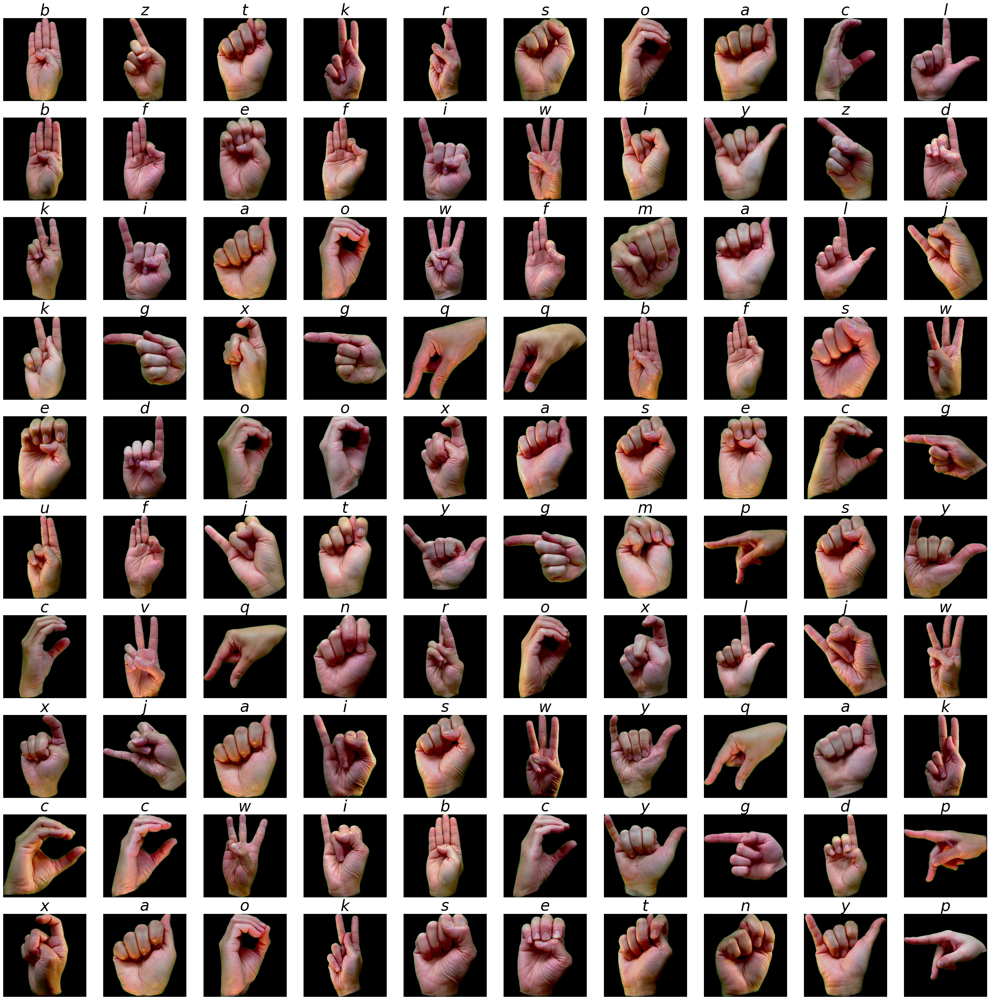

In [ ]:
plt.figure(figsize=(40,40))

for i in range(100):
    path = base_path + df.filename[i]
    img = plt.imread(path)
    plt.subplot(10,10, i + 1)
    plt.imshow(img)
    plt.title(categories[df.category[i]],fontsize=35,fontstyle='italic')
    plt.axis("off")

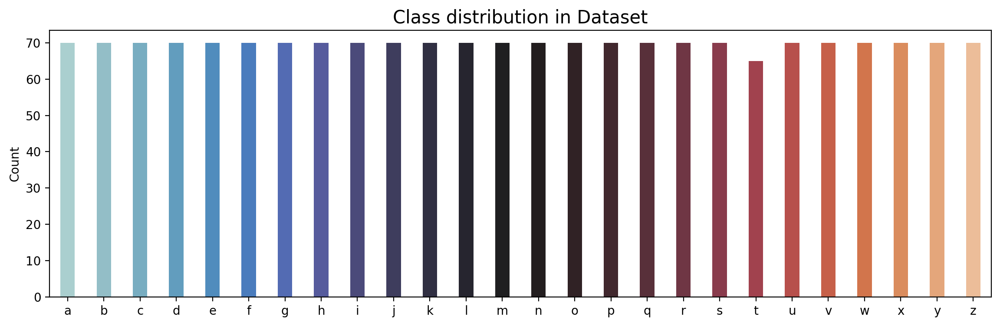

In [ ]:
label,count = np.unique(df.category,return_counts=True)
uni = pd.DataFrame(data=count,index=categories.values(),columns=['Count'])

plt.figure(figsize=(14,4),dpi=200)
sns.barplot(data=uni,x=uni.index,y='Count',palette='icefire',width=0.4).set_title('Class distribution in Dataset',fontsize=15)
plt.show()

# **Model 1 : SVM for the second dataset**


preprocessing for SVM

In [ ]:
def load_images(df, base_path):
    images = []
    labels = []

    for index, row in df.iterrows():
        img_path = os.path.join(base_path, row['filename'])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
        img = cv2.resize(img, (64, 64))  # Resize the image to a consistent size
        images.append(img.flatten())  # Flatten the image matrix
        labels.append(row['category'])

    return np.array(images), np.array(labels)

# Load and preprocess images
images, labels = load_images(df, base_path)

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train2, y_test2 = train_test_split(images, labels, test_size=0.2, random_state=42)

# Print the shapes of the resulting sets
print(f"Shape of X_train: {np.array(X_train).shape}")
print(f"Shape of X_test: {np.array(X_test).shape}")
print(f"Shape of y_train: {np.array(y_train2).shape}")
print(f"Shape of y_test: {np.array(y_test2).shape}")

Shape of X_train: (1452, 4096)
Shape of X_test: (363, 4096)
Shape of y_train: (1452,)
Shape of y_test: (363,)


In [ ]:
# Standardize features by removing the mean and scaling to unit variance
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

**Model Evaluation**

Finding the Best Parameters using GridSearchCV and Create SVM with RBF kernel

In [ ]:
param_grid_S = {'svc__C': [1, 5, 10],
              'svc__gamma': [0.0005, 0.001, 0.005]}

#Create SVM with RBF kernel
pca = RandomizedPCA(n_components=150, whiten=True, random_state=42)
svm = SVC(kernel='rbf', class_weight='balanced')
model = make_pipeline(pca, svm)

grid = GridSearchCV(model, param_grid_S, scoring='accuracy', cv=5, verbose=2, return_train_score=True)

%time grid.fit(X_train, y_train2)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time=   2.1s
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time=   1.7s
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time=   1.3s
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time=   1.4s
[CV] END ........................svc__C=1, svc__gamma=0.0005; total time=   1.3s
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=   1.4s
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=   2.8s
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=   3.3s
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=   2.1s
[CV] END .........................svc__C=1, svc__gamma=0.001; total time=   1.9s
[CV] END .........................svc__C=1, svc__gamma=0.005; total time=   1.3s
[CV] END .........................svc__C=1, svc__

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('pca',
                                        PCA(n_components=150, random_state=42,
                                            whiten=True)),
                                       ('svc', SVC(class_weight='balanced'))]),
             param_grid={'svc__C': [1, 5, 10],
                         'svc__gamma': [0.0005, 0.001, 0.005]},
             return_train_score=True, scoring='accuracy', verbose=2)

In [ ]:
print(f'Best parameters are: {grid.best_params_}')
mean_score = grid.cv_results_['mean_test_score']
std_score = grid.cv_results_['std_test_score']
params = grid.cv_results_['params']
for mean,std,params in zip(mean_score,std_score,params):
      print(f'{round(mean,2)} + or -{round(std,2)} for the {params}')

Best parameters are: {'svc__C': 5, 'svc__gamma': 0.005}
0.88 + or -0.02 for the {'svc__C': 1, 'svc__gamma': 0.0005}
0.93 + or -0.01 for the {'svc__C': 1, 'svc__gamma': 0.001}
0.97 + or -0.01 for the {'svc__C': 1, 'svc__gamma': 0.005}
0.96 + or -0.01 for the {'svc__C': 5, 'svc__gamma': 0.0005}
0.97 + or -0.01 for the {'svc__C': 5, 'svc__gamma': 0.001}
0.98 + or -0.01 for the {'svc__C': 5, 'svc__gamma': 0.005}
0.97 + or -0.01 for the {'svc__C': 10, 'svc__gamma': 0.0005}
0.98 + or -0.01 for the {'svc__C': 10, 'svc__gamma': 0.001}
0.98 + or -0.01 for the {'svc__C': 10, 'svc__gamma': 0.005}


Predict and evaluate the model using the best parameters

In [ ]:
model = grid.best_estimator_
y_pred = model.predict(X_test)

#calculate and print the accuracy and f1 scores for SVM with the best RBF kernel:
bestRBF_accuracy = accuracy_score(y_test2, y_pred)
bestRBF_f1 = f1_score(y_test2, y_pred, average='weighted')
print('RBF Accuracy : ', "%.2f" % (bestRBF_accuracy))
print('RBF F1 : ', "%.2f" % (bestRBF_f1))

RBF Accuracy :  0.98
RBF F1 :  0.98


test images along with their predicted values

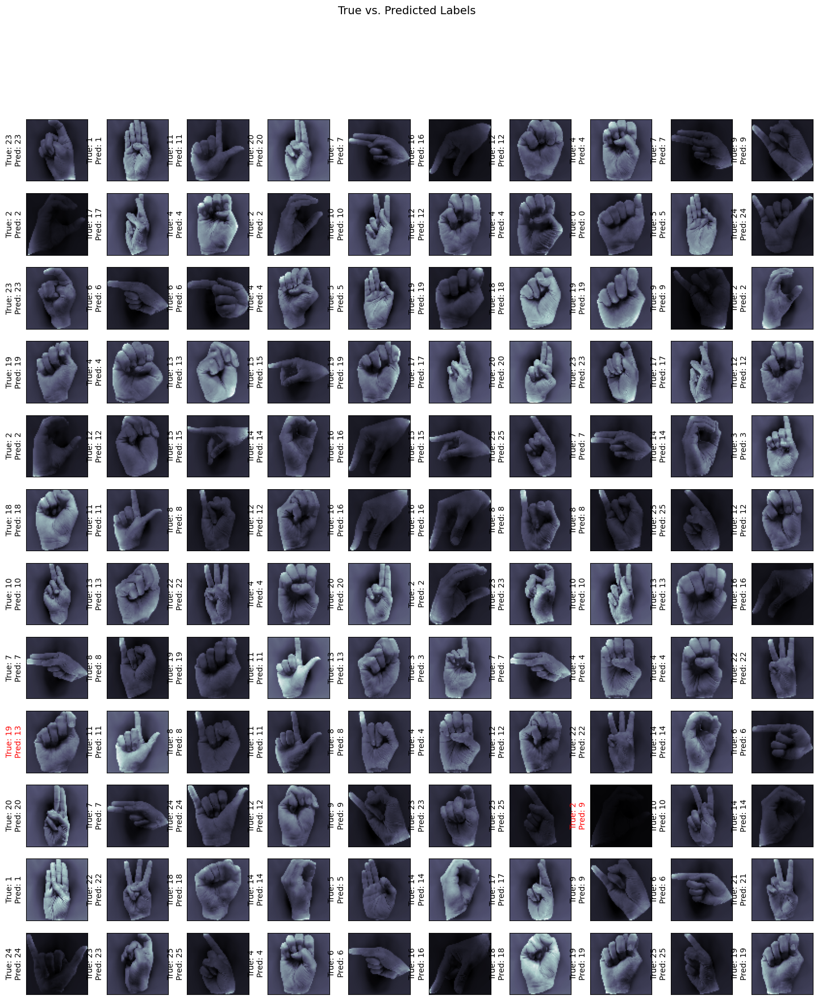

In [ ]:
fig, ax = plt.subplots(12, 10, figsize=(18, 20))

# Iterate over the subplots
for i, axi in enumerate(ax.flat):
    axi.imshow(X_test[i].reshape(64, 64), cmap='bone')  # Adjust the reshape size
    axi.set(xticks=[], yticks=[])

    # Use the true and predicted labels directly
    true_label = y_test2[i]
    predicted_label = y_pred[i]

    # Check if the prediction is correct
    color = 'black' if predicted_label == true_label else 'red'

    axi.set_ylabel(f'True: {true_label}\nPred: {predicted_label}', color=color)

fig.suptitle('True vs. Predicted Labels', size=14)
plt.show()


Classification report

In [ ]:
print(classification_report(y_test2, y_pred,
                            target_names=list(categories.values())))

              precision    recall  f1-score   support

           a       1.00      1.00      1.00        12
           b       1.00      0.90      0.95        10
           c       1.00      0.94      0.97        17
           d       0.92      1.00      0.96        11
           e       1.00      1.00      1.00        25
           f       1.00      1.00      1.00         9
           g       1.00      1.00      1.00        11
           h       1.00      1.00      1.00        22
           i       1.00      1.00      1.00        17
           j       0.80      1.00      0.89         8
           k       1.00      1.00      1.00        11
           l       1.00      1.00      1.00        13
           m       1.00      1.00      1.00        20
           n       0.93      1.00      0.97        14
           o       1.00      1.00      1.00        16
           p       1.00      1.00      1.00        12
           q       1.00      1.00      1.00        13
           r       0.62    

confusion matrix

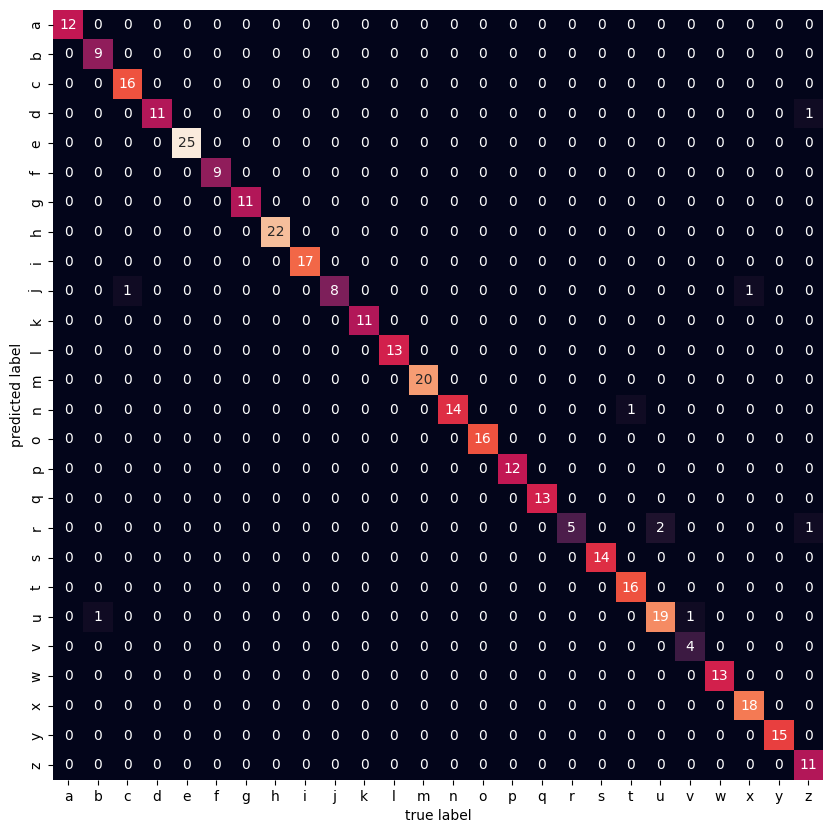

In [ ]:
mat = confusion_matrix(y_test2, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(categories.values()),
            yticklabels=list(categories.values()))
plt.xlabel('true label')
plt.ylabel('predicted label');

learning curve

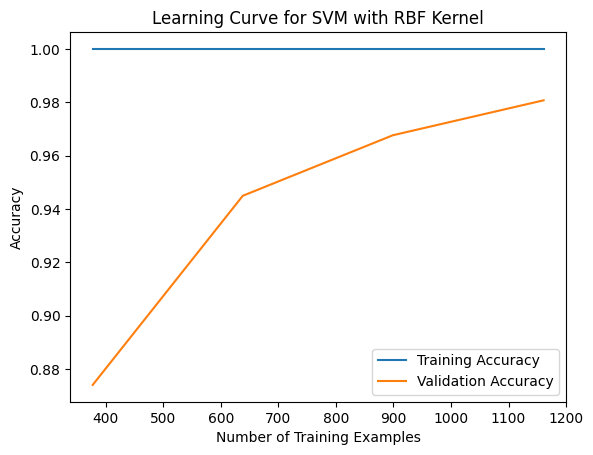

In [ ]:
train_sizes, train_scores, valid_scores = learning_curve(
    model, X_train, y_train2, cv=5, scoring='accuracy', n_jobs=-1)

plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Accuracy')
plt.plot(train_sizes, np.mean(valid_scores, axis=1), label='Validation Accuracy')

plt.title('Learning Curve for SVM with RBF Kernel')
plt.xlabel('Number of Training Examples')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# **Model 2 : CNN for the second dataset**

**Train/Test Split**

We will split the data into 3 parts:
* Training dataset (80%)
* Validation dataset (10%)
* Testing dataset (10%)

In [ ]:
input_folder = '/content/drive/MyDrive/Project/asl'
output_folder = '/content/drive/MyDrive/Project/split_data'

splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.8,0.1,0.1), group_prefix=None)

In [ ]:
datagen = ImageDataGenerator(rescale= 1.0 / 255)

In [ ]:
train_path = '/content/drive/MyDrive/Project/split_data/train'
val_path = '/content/drive/MyDrive/Project/split_data/val'
test_path = '/content/drive/MyDrive/Project/split_data/test'
#important parameters and respective values.
batch = 128
image_size = 200
img_channel = 3
n_classes = 26

In [ ]:
train_data = datagen.flow_from_directory(directory= train_path,
                                         target_size=(image_size,image_size),
                                         batch_size = batch,
                                         class_mode='categorical')

val_data = datagen.flow_from_directory(directory= val_path,
                                       target_size=(image_size,image_size),
                                       batch_size = batch,
                                       class_mode='categorical',
                                       )

test_data = datagen.flow_from_directory(directory= test_path,
                                         target_size=(image_size,image_size),
                                         batch_size = batch,
                                         class_mode='categorical',
                                         shuffle= False)


Found 1452 images belonging to 26 classes.
Found 181 images belonging to 26 classes.
Found 182 images belonging to 26 classes.


Training the model

In [ ]:
CNN2_model = Sequential()

CNN2_model.add(Conv2D(32,3,activation='relu',padding='same',input_shape = (image_size,image_size,img_channel)))
CNN2_model.add(Conv2D(32,3,activation='relu',padding='same'))

CNN2_model.add(MaxPooling2D(padding='same'))
CNN2_model.add(Dropout(0.2))

CNN2_model.add(Conv2D(64,3,activation='relu',padding='same'))
CNN2_model.add(Conv2D(64,3,activation='relu',padding='same'))

CNN2_model.add(MaxPooling2D(padding='same'))
CNN2_model.add(Dropout(0.3))

CNN2_model.add(Conv2D(128,3,activation='relu',padding='same'))
CNN2_model.add(Conv2D(128,3,activation='relu',padding='same'))

CNN2_model.add(MaxPooling2D(padding='same'))
CNN2_model.add(Dropout(0.4))

CNN2_model.add(Flatten())

CNN2_model.add(Dense(512,activation='relu'))
CNN2_model.add(Dropout(0.2))
CNN2_model.add(Dense(128,activation='relu'))
CNN2_model.add(Dropout(0.3))

CNN2_model.add(Dense(26, activation='softmax'))

CNN2_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 200, 200, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 100, 100, 32)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 100, 100, 32)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 100, 100, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 100, 100, 64)      36928     
                                                        

Call backs

In [ ]:
#EarlyStopping : Stop training when a monitored metric has stopped improving.
early_stoping = EarlyStopping(monitor='val_loss',
                              min_delta=0.001,
                              patience= 5,
                              restore_best_weights= True,
                              verbose = 0)
#ReduceLROnPlateau : Reduce learning rate when a metric has stopped improving.
reduce_learning_rate = ReduceLROnPlateau(monitor='val_accuracy',
                                         patience = 2,
                                         factor=0.5 ,
                                         verbose = 1)

Compile the model

In [ ]:
CNN2_model.compile(optimizer='adam', loss = 'categorical_crossentropy' , metrics=['accuracy'])

Fit the model

In [ ]:
asl_class = CNN2_model.fit(train_data,
                      validation_data= val_data,
                      epochs=20,
                      callbacks=[early_stoping,reduce_learning_rate],
                      verbose = 1)

Epoch 1/20
12/12 [==============================] - 528s 42s/step - loss: 2.6168 - accuracy: 0.2404 - val_loss: 1.4873 - val_accuracy: 0.7845 - lr: 0.0010
Epoch 2/20
12/12 [==============================] - 8s 646ms/step - loss: 0.9969 - accuracy: 0.6949 - val_loss: 0.2757 - val_accuracy: 0.9116 - lr: 0.0010
Epoch 3/20
12/12 [==============================] - 8s 622ms/step - loss: 0.3732 - accuracy: 0.8912 - val_loss: 0.0930 - val_accuracy: 0.9669 - lr: 0.0010
Epoch 4/20
12/12 [==============================] - 8s 682ms/step - loss: 0.2522 - accuracy: 0.9311 - val_loss: 0.0770 - val_accuracy: 0.9724 - lr: 0.0010
Epoch 5/20
12/12 [==============================] - 8s 610ms/step - loss: 0.1733 - accuracy: 0.9449 - val_loss: 0.0659 - val_accuracy: 0.9779 - lr: 0.0010
Epoch 6/20
12/12 [==============================] - 8s 660ms/step - loss: 0.1055 - accuracy: 0.9607 - val_loss: 0.0556 - val_accuracy: 0.9724 - lr: 0.0010
Epoch 7/20
12/12 [==============================] - 8s 597ms/step - lo

Save the model

In [ ]:
CNN2_model.save('CNN2_model')

Evaluation

In [ ]:
# Evaluvate for train generator
loss,acc = CNN2_model.evaluate(train_data , verbose = 0)

print('The accuracy of the model for training data is:',acc*100)
print('The Loss of the model for training data is:',loss)

# Evaluvate for validation generator
loss,acc = CNN2_model.evaluate(val_data, verbose = 0)

print('The accuracy of the model for validation data is:',acc*100)
print('The Loss of the model for validation data is:',loss)

The accuracy of the model for training data is: 99.93112683296204
The Loss of the model for training data is: 0.0010617541847750545
The accuracy of the model for validation data is: 100.0
The Loss of the model for validation data is: 0.00033673239522613585


Plotting the results

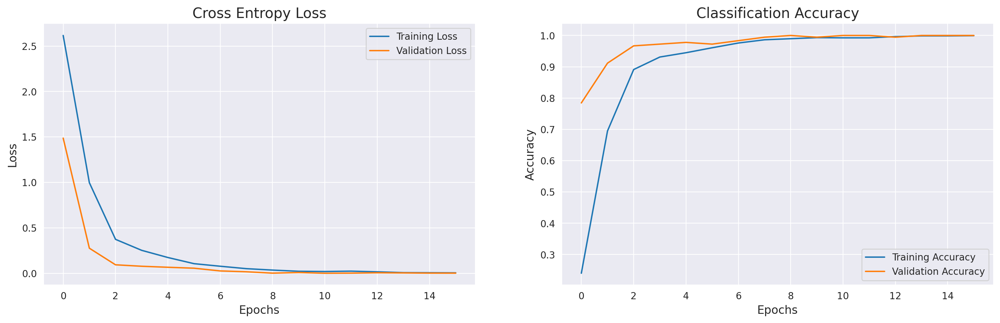

In [ ]:
# plots for accuracy and Loss with epochs

error = pd.DataFrame(asl_class.history)

plt.figure(figsize=(18, 5), dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss', fontsize=15)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.plot(error['loss'], label='Training Loss')
plt.plot(error['val_loss'], label='Validation Loss')
plt.legend()

plt.subplot(122)
plt.title('Classification Accuracy', fontsize=15)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.plot(error['accuracy'], label='Training Accuracy')
plt.plot(error['val_accuracy'], label='Validation Accuracy')
plt.legend()

plt.show()


Prediction

In [ ]:
result = CNN2_model.predict(test_data,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_data.labels

Evaluation

In [ ]:
loss,acc = CNN2_model.evaluate(test_data,verbose = 0)

print('The accuracy of the model for testing data:',acc*100)
print('The Loss of the model for testing data:',loss)

The accuracy of the model for testing data: 100.0
The Loss of the model for testing data: 0.0002568225027061999


Classification Report

In [ ]:
print(classification_report(y_true, y_pred,target_names= categories.values()))

              precision    recall  f1-score   support

           a       1.00      1.00      1.00         7
           b       1.00      1.00      1.00         7
           c       1.00      1.00      1.00         7
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         7
           g       1.00      1.00      1.00         7
           h       1.00      1.00      1.00         7
           i       1.00      1.00      1.00         7
           j       1.00      1.00      1.00         7
           k       1.00      1.00      1.00         7
           l       1.00      1.00      1.00         7
           m       1.00      1.00      1.00         7
           n       1.00      1.00      1.00         7
           o       1.00      1.00      1.00         7
           p       1.00      1.00      1.00         7
           q       1.00      1.00      1.00         7
           r       1.00    

Confusion matrix

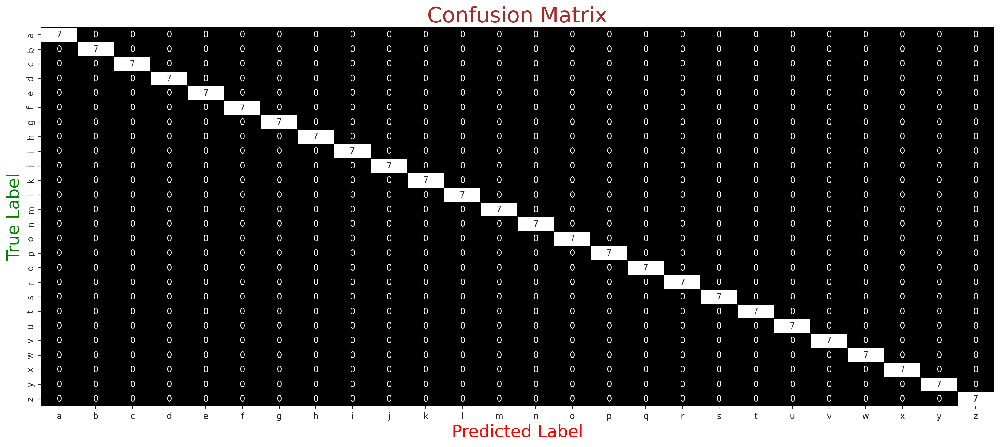

In [ ]:
sns.set_style('ticks')

confusion_mtx = confusion_matrix(y_true,y_pred)

f,ax = plt.subplots(figsize = (20,8),dpi=200)

sns.heatmap(confusion_mtx, annot=True,
            linewidths=0.1, cmap = "gist_yarg_r",
            linecolor="black", fmt='.0f', ax=ax,
            cbar=False, xticklabels=categories.values(),
            yticklabels=categories.values())

plt.xlabel("Predicted Label",fontdict={'color':'red','size':20})
plt.ylabel("True Label",fontdict={'color':'green','size':20})
plt.title("Confusion Matrix",fontdict={'color':'brown','size':25})

plt.show()

# **Model 3 : Random Forest for the second dataset**

Using GridSearchCV to find the best hyperparameters for Random Forest model and then print it

In [ ]:
param_grid2 = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 15, 20],
}

clf2 = RandomForestClassifier()

grid_search2 = GridSearchCV(clf2, param_grid2, cv=5)

# Fit the GridSearchCV object on the training data
grid_search2.fit(X_train, y_train2)

best_params2 = grid_search2.best_params_
print(f"Best Parameters: {best_params2}")

Best Parameters: {'max_depth': 20, 'n_estimators': 100}


Fitting the best RF model and then evaluating it's performance using the testing data

In [ ]:
best_model2 = grid_search2.best_estimator_

# Make predictions on the test data
rf_pred2 = best_model2.predict(X_test)

# Evaluate the model and Print the evaluation metrics
print("Accuracy:", accuracy_score(y_test2, rf_pred2))
print("Precision:", precision_score(y_test2, rf_pred2, average='micro'))
print("Recall:", recall_score(y_test2, rf_pred2, average='micro'))
print("F1-Score:", f1_score(y_test2, rf_pred2, average='micro'))

Accuracy: 0.9862258953168044
Precision: 0.9862258953168044
Recall: 0.9862258953168044
F1-Score: 0.9862258953168044


Classification Report

In [ ]:
print(classification_report(y_test2, rf_pred2,target_names= categories.values()))

              precision    recall  f1-score   support

           a       1.00      1.00      1.00        14
           b       1.00      1.00      1.00        19
           c       1.00      1.00      1.00        14
           d       0.95      1.00      0.98        21
           e       1.00      1.00      1.00        16
           f       1.00      0.95      0.97        20
           g       1.00      1.00      1.00         8
           h       1.00      1.00      1.00        13
           i       1.00      1.00      1.00         9
           j       0.92      1.00      0.96        11
           k       1.00      0.91      0.95        11
           l       1.00      1.00      1.00        15
           m       1.00      0.92      0.96        12
           n       0.92      1.00      0.96        12
           o       1.00      1.00      1.00        14
           p       1.00      1.00      1.00        11
           q       1.00      1.00      1.00        19
           r       1.00    

Confusion matrix

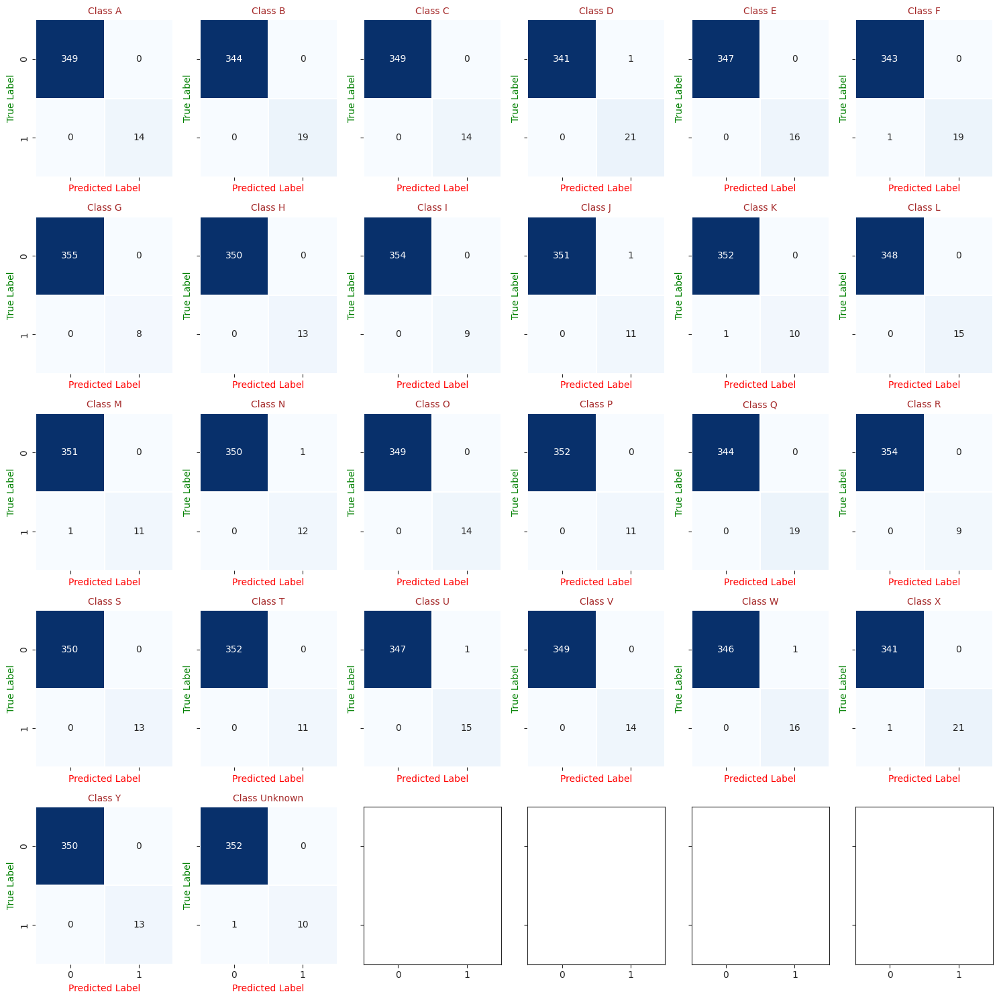

In [ ]:
sns.set_style('ticks')

confusion_mtx = multilabel_confusion_matrix(y_test2, rf_pred2)

# Number of classes
num_classes = confusion_mtx.shape[0]

# Determine the number of rows and columns for the subplot grid
grid_size = int(num_classes**0.5)
num_rows = grid_size
num_cols = (num_classes // num_rows) + 1 if num_classes % num_rows != 0 else num_classes // num_rows

# Create a subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15), sharex=True, sharey=True)

# Flatten the axes if there's only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot each confusion matrix in the grid
for class_index, ax in zip(range(num_classes), axes):
    sns.heatmap(confusion_mtx[class_index], annot=True,
                linewidths=0.1, cmap="Blues", fmt='.0f', ax=ax,
                cbar=False)

    ax.set_xlabel("Predicted Label", fontdict={'color': 'red', 'size': 10})
    ax.set_ylabel("True Label", fontdict={'color': 'green', 'size': 10})
    ax.set_title(f"Class {categories1.get(class_index, 'Unknown')}", fontdict={'color': 'brown', 'size': 10})

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
